In [1]:
import os
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
import dask.dataframe as dd
# import missingno as msno
# from dask.distributed import Client
import seaborn as sns
import gc
import warnings

# Ignore all warnings
warnings.filterwarnings("ignore")
warnings.resetwarnings()


import os
for dirname, _, filenames in os.walk('cmi_data/'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
        train_series = dd.read_parquet(os.path.join(dirname, 'train_series.parquet'))
        test_series  = dd.read_parquet(os.path.join(dirname, 'test_series.parquet'))
        train_events = dd.read_csv(os.path.join(dirname, 'train_events.csv'))
        sample_submission = pd.read_csv(os.path.join(dirname,'sample_submission.csv'))

cmi_data/train_events.csv
cmi_data/test_series.parquet
cmi_data/sample_submission.csv
cmi_data/train_series.parquet


In [2]:
train_series

,series_id,step,timestamp,anglez,enmo
npartitions=28,,,,,
,string,uint32,string,float32,float32
,...,...,...,...,...
...,...,...,...,...,...
,...,...,...,...,...
,...,...,...,...,...


In [3]:
%%time
train_series.compute()

CPU times: user 24.6 s, sys: 23.5 s, total: 48.1 s
Wall time: 15.4 s


,series_id,step,timestamp,anglez,enmo
0,038441c925bb,0,2018-08-14T15:30:00-0400,2.636700,0.0217
1,038441c925bb,1,2018-08-14T15:30:05-0400,2.636800,0.0215
2,038441c925bb,2,2018-08-14T15:30:10-0400,2.637000,0.0216
3,038441c925bb,3,2018-08-14T15:30:15-0400,2.636800,0.0213
4,038441c925bb,4,2018-08-14T15:30:20-0400,2.636800,0.0215
...,...,...,...,...,...
524425,fe90110788d2,592375,2017-09-08T00:14:35-0400,-27.277500,0.0204
524426,fe90110788d2,592376,2017-09-08T00:14:40-0400,-27.032499,0.0233
524427,fe90110788d2,592377,2017-09-08T00:14:45-0400,-26.841200,0.0202
524428,fe90110788d2,592378,2017-09-08T00:14:50-0400,-26.723900,0.0199


To show the shape of a Dask DataFrame, you need to be aware that Dask is lazy in its execution. This means that it doesn’t compute the actual data until explicitly instructed to do so. Unlike Pandas, where you can directly call df.shape to get the number of rows and columns, in Dask, you need to trigger the computation.

In Dask, the .compute() method is used to trigger the actual execution of a computation. This is necessary because Dask operates on a lazy evaluation model, meaning that when you create a Dask DataFrame, Dask builds a task graph to represent the operations you want to perform but does not execute them immediately. This allows Dask to work efficiently with large datasets that don't fit in memory.

A computation graph consist of subtask , the route,the recipe to get to the final result, but doesn't actually execute it.It is lazy and it's precisely this lazy evaluation that allows Dask to optimize computations for parallel processing.No computation happens unless you specifically tell Dask to do so by calling compute.

In [5]:
# List of datasets and corresponding names
data_list = [train_series, train_events, test_series]
data_names = ['TRAIN_SERIES', 'TRAIN_EVENTS', 'TEST_SERIES']

# Loop through each dataset in the list
for i in range(len(data_list)):
    # Number of rows (trigger computation with .shape and .compute())
    num_rows = data_list[i].shape[0].compute()

    # Number of columns (this doesn't require computation)
    num_columns = len(data_list[i].columns)

    # Output information on the dataset
    print(f"\nShape of {data_names[i]}: ({num_rows}, {num_columns})\n")

    # Small sample for exploration (1% of the dataset or 0.1% for larger datasets)
    sample_df = data_list[i].sample(frac=0.001).compute()  # Adjust frac based on your memory capacity

    # Show basic info and description of the sample
    print(sample_df.info())
    print(sample_df.describe())

    print(sample_df.isnull().sum())

    print(f"\n{sample_df.isna().sum()}")

    print("\n------------------------------------\n")


Shape of TRAIN_SERIES: (127946340, 5)

<class 'pandas.core.frame.DataFrame'>
Index: 127937 entries, 1761521 to 435379
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   series_id  127937 non-null  string 
 1   step       127937 non-null  uint32 
 2   timestamp  127937 non-null  string 
 3   anglez     127937 non-null  float32
 4   enmo       127937 non-null  float32
dtypes: float32(2), string(2), uint32(1)
memory usage: 8.8 MB
None
               step         anglez           enmo
count  1.279370e+05  127937.000000  127937.000000
mean   2.548903e+05      -8.890666       0.041281
std    1.782314e+05      35.562141       0.102378
min    2.000000e+00     -90.000000       0.000000
25%    1.158070e+05     -31.899401       0.001300
50%    2.339520e+05      -9.579500       0.017200
75%    3.568220e+05      11.242900       0.043500
max    1.433092e+06      90.000000       4.039300
series_id    0
step         0
timestamp    0


In [6]:
# Sample 0.1% of the data for exploration
sample_train_series = train_series.sample(frac=0.001).compute()
sample_train_events = train_events.sample(frac=0.1).compute()

In [8]:
# For train_series
missing_train_series = sample_train_series.isnull().sum()
print('Missing values in train_series:\n', missing_train_series)

# For train_events
missing_train_events = sample_train_events.isnull().sum()
print('Missing values in train_events:\n', missing_train_events)

Missing values in train_series:
 series_id    0
step         0
timestamp    0
anglez       0
enmo         0
dtype: int64
Missing values in train_events:
 series_id      0
night          0
event          0
step         501
timestamp    501
dtype: int64


In [11]:
# Convert 'timestamp' to datetime
sample_train_series['timestamp'] = pd.to_datetime(sample_train_series['timestamp'], utc=True)
sample_train_events['timestamp'] = pd.to_datetime(sample_train_events['timestamp'], utc=True)

VISUALISATION

In [12]:
%matplotlib inline

In [14]:
sample_train_events

,series_id,night,event,step,timestamp
7252,89c7daa72eee,19,onset,NaN,NaT
12205,df33ae359fb5,14,wakeup,NaN,NaT
26,038441c925bb,14,onset,NaN,NaT
11234,d043c0ca71cd,36,onset,612900.0,2019-01-31 03:30:00+00:00
12161,def21f50dd3c,13,wakeup,220944.0,2017-08-28 12:37:00+00:00
...,...,...,...,...,...
4502,559ffb7c166a,3,onset,38736.0,2018-10-20 01:48:00+00:00
4157,4ac356361be9,10,wakeup,165672.0,2018-01-29 11:21:00+00:00
9778,bf00506437aa,13,onset,212976.0,2019-06-13 01:18:00+00:00
3686,405df1b41f9f,19,onset,NaN,NaT


In [18]:
sample_train_events['date'] = sample_train_events["timestamp"].dt.date
sample_train_events['hour'] = sample_train_events["timestamp"].dt.hour
sample_train_events['time'] = sample_train_events["timestamp"].dt.time

In [19]:
sample_train_events

,series_id,night,event,step,timestamp,date,hour,time
7252,89c7daa72eee,19,onset,NaN,NaT,NaT,NaN,NaT
12205,df33ae359fb5,14,wakeup,NaN,NaT,NaT,NaN,NaT
26,038441c925bb,14,onset,NaN,NaT,NaT,NaN,NaT
11234,d043c0ca71cd,36,onset,612900.0,2019-01-31 03:30:00+00:00,2019-01-31,3.0,03:30:00
12161,def21f50dd3c,13,wakeup,220944.0,2017-08-28 12:37:00+00:00,2017-08-28,12.0,12:37:00
...,...,...,...,...,...,...,...,...
4502,559ffb7c166a,3,onset,38736.0,2018-10-20 01:48:00+00:00,2018-10-20,1.0,01:48:00
4157,4ac356361be9,10,wakeup,165672.0,2018-01-29 11:21:00+00:00,2018-01-29,11.0,11:21:00
9778,bf00506437aa,13,onset,212976.0,2019-06-13 01:18:00+00:00,2019-06-13,1.0,01:18:00
3686,405df1b41f9f,19,onset,NaN,NaT,NaT,NaN,NaT


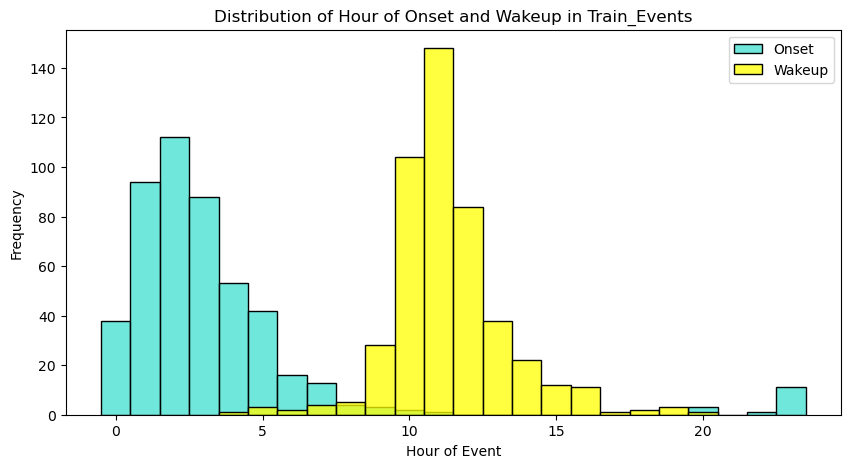

In [26]:
# Set figure size
plt.figure(figsize=(10, 5))

# Assuming your DataFrame is called train_events
df_onset = sample_train_events[sample_train_events['event'] == 'onset']
df_wakeup = sample_train_events[sample_train_events['event'] == 'wakeup']

# Plotting the distribution plot for onset events
sns.histplot(df_onset['hour'].dropna(), kde=False, bins=12, label='Onset', discrete=True, color='turquoise')

# Plotting the distribution plot for wakeup events
sns.histplot(df_wakeup['hour'].dropna(), kde=False, bins=12, label='Wakeup', discrete=True, color='yellow')

# Adding labels and title
plt.xlabel('Hour of Event')
plt.ylabel('Frequency')
plt.title('Distribution of Hour of Onset and Wakeup in Train_Events')
plt.legend()

# Show the plot
plt.show()

In [10]:
import matplotlib.pyplot as plt
import pandas as pd
import dask.dataframe as dd

def plot_series_with_events(series_id, train_series, train_events):
    # Filter the DataFrame based on the series_id
    sample_serie = train_series[train_series['series_id'] == series_id]

    # Ensure the timestamp is converted to Pandas datetime
    sample_serie['timestamp'] = dd.to_datetime(sample_serie['timestamp'])  # Convert to datetime

    # Compute the filtered series (convert from Dask to Pandas)
    sample_serie_pd = sample_serie.compute()

    # Filter event data based on the series_id
    sample_events = train_events[train_events['series_id'] == series_id]
    sample_onset = sample_events.loc[sample_events['event'] == 'onset', 'timestamp'].dropna()
    sample_wakeup = sample_events.loc[sample_events['event'] == 'wakeup', 'timestamp'].dropna()

    # Convert events to datetime and compute (if they are still Dask objects)
    sample_onset_pd = pd.to_datetime(sample_onset.compute() if isinstance(sample_onset, dd.Series) else sample_onset)
    sample_wakeup_pd = pd.to_datetime(sample_wakeup.compute() if isinstance(sample_wakeup, dd.Series) else sample_wakeup)

    # Helper function to plot data and events
    def plot_data_and_events(data, ylabel):
        plt.figure(figsize=(20, 3))
        plt.plot(sample_serie_pd['timestamp'], sample_serie_pd[data], label=data, linewidth=1)

        for onset in sample_onset_pd:
            plt.axvline(x=onset, color='r', linestyle='--', label='onset')

        for wakeup in sample_wakeup_pd:
            plt.axvline(x=wakeup, color='g', linestyle='--', label='wakeup')

        # Avoid duplicate labels in the legend
        handles, labels = plt.gca().get_legend_handles_labels()
        new_labels, new_handles = [], []
        for handle, label in zip(handles, labels):
            if label not in new_labels:
                new_handles.append(handle)
                new_labels.append(label)

        plt.legend(new_handles, new_labels)
        plt.xlabel('Timestamp')
        plt.ylabel(ylabel)
        plt.title(f'{ylabel} over Time with Event Flags - {series_id}')
        plt.show()

    # Plot enmo and anglez
    plot_data_and_events('enmo', 'ENMO Value')
    plot_data_and_events('anglez', 'anglez Value')



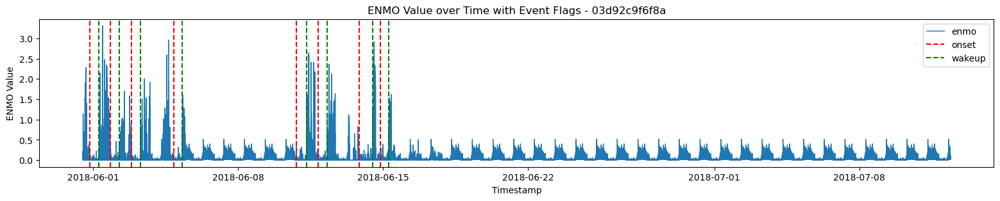

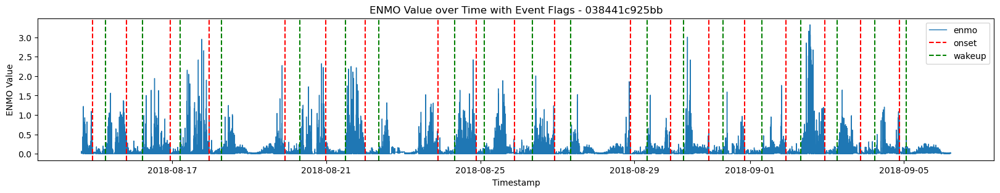

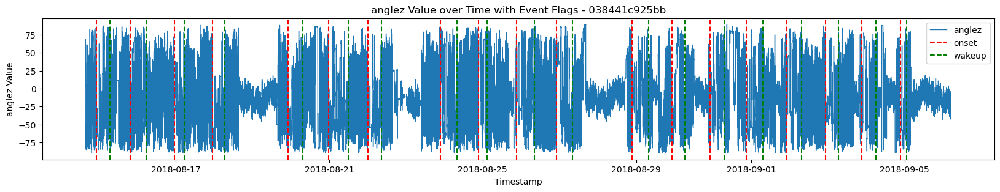

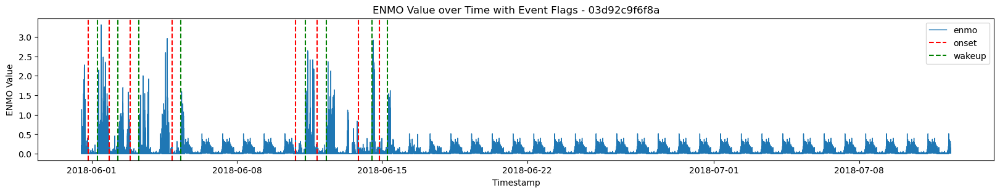

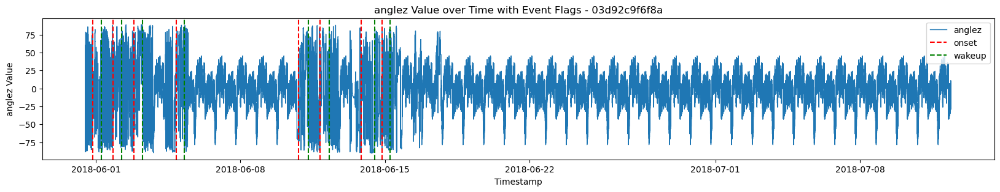

...

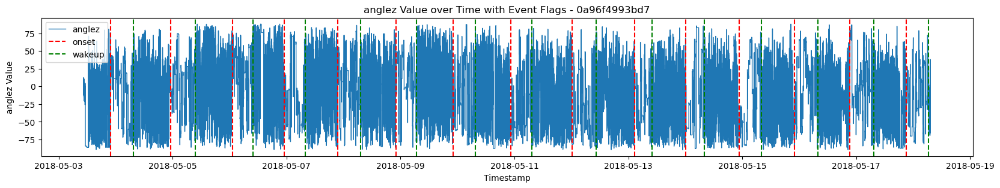

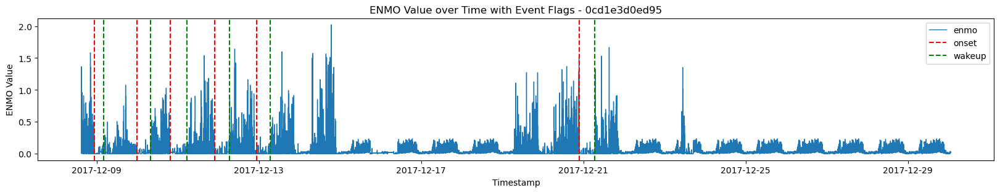

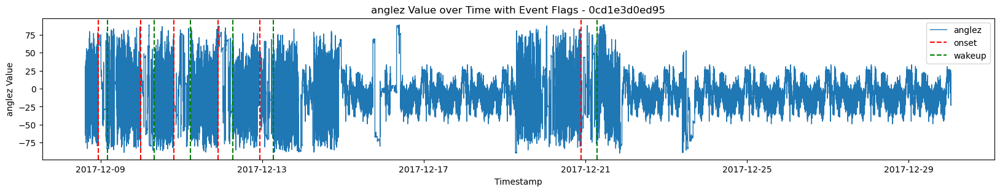

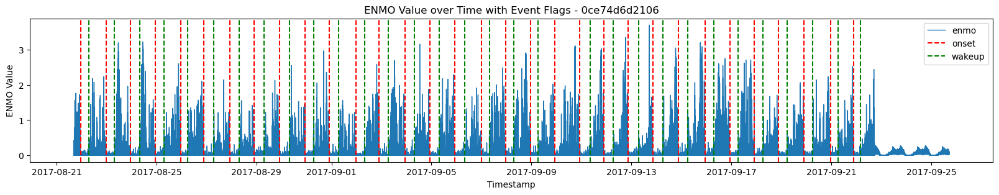

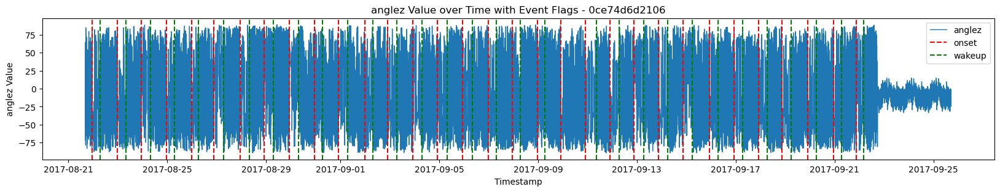

In [11]:
%matplotlib inline

# Example usage of the function for the first 10 series_ids:
for series_id in train_events['series_id'].unique()[:10]:
    plot_series_with_events(series_id, train_series, train_events)

In [64]:
example = train_series.loc[train_series['series_id'] == 'fe90110788d2'].reset_index(drop=True).copy()
example.compute()

,series_id,step,timestamp,anglez,enmo
0,fe90110788d2,0,2017-08-04T17:30:00-0400,-27.707001,0.0298
1,fe90110788d2,1,2017-08-04T17:30:05-0400,-33.867500,0.0488
2,fe90110788d2,2,2017-08-04T17:30:10-0400,-15.475000,0.1077
3,fe90110788d2,3,2017-08-04T17:30:15-0400,-73.656197,0.0530
4,fe90110788d2,4,2017-08-04T17:30:20-0400,-53.152901,0.0601
...,...,...,...,...,...
524425,fe90110788d2,592375,2017-09-08T00:14:35-0400,-27.277500,0.0204
524426,fe90110788d2,592376,2017-09-08T00:14:40-0400,-27.032499,0.0233
524427,fe90110788d2,592377,2017-09-08T00:14:45-0400,-26.841200,0.0202
524428,fe90110788d2,592378,2017-09-08T00:14:50-0400,-26.723900,0.0199


In [67]:
example['timestamp'] = dd.to_datetime(example['timestamp'])
example['date'] = example["timestamp"].dt.date
example['hour'] = example["timestamp"].dt.hour
example['time'] = example["timestamp"].dt.time

example.compute()

,series_id,step,timestamp,anglez,enmo,date,hour,time
0,fe90110788d2,0,2017-08-04 17:30:00-04:00,-27.707001,0.0298,2017-08-04,17,17:30:00
1,fe90110788d2,1,2017-08-04 17:30:05-04:00,-33.867500,0.0488,2017-08-04,17,17:30:05
2,fe90110788d2,2,2017-08-04 17:30:10-04:00,-15.475000,0.1077,2017-08-04,17,17:30:10
3,fe90110788d2,3,2017-08-04 17:30:15-04:00,-73.656197,0.0530,2017-08-04,17,17:30:15
4,fe90110788d2,4,2017-08-04 17:30:20-04:00,-53.152901,0.0601,2017-08-04,17,17:30:20
...,...,...,...,...,...,...,...,...
524425,fe90110788d2,592375,2017-09-08 00:14:35-04:00,-27.277500,0.0204,2017-09-08,0,00:14:35
524426,fe90110788d2,592376,2017-09-08 00:14:40-04:00,-27.032499,0.0233,2017-09-08,0,00:14:40
524427,fe90110788d2,592377,2017-09-08 00:14:45-04:00,-26.841200,0.0202,2017-09-08,0,00:14:45
524428,fe90110788d2,592378,2017-09-08 00:14:50-04:00,-26.723900,0.0199,2017-09-08,0,00:14:50


In [69]:
df_example = example.compute()

In [70]:
df_example

,series_id,step,timestamp,anglez,enmo,date,hour,time
0,fe90110788d2,0,2017-08-04 17:30:00-04:00,-27.707001,0.0298,2017-08-04,17,17:30:00
1,fe90110788d2,1,2017-08-04 17:30:05-04:00,-33.867500,0.0488,2017-08-04,17,17:30:05
2,fe90110788d2,2,2017-08-04 17:30:10-04:00,-15.475000,0.1077,2017-08-04,17,17:30:10
3,fe90110788d2,3,2017-08-04 17:30:15-04:00,-73.656197,0.0530,2017-08-04,17,17:30:15
4,fe90110788d2,4,2017-08-04 17:30:20-04:00,-53.152901,0.0601,2017-08-04,17,17:30:20
...,...,...,...,...,...,...,...,...
524425,fe90110788d2,592375,2017-09-08 00:14:35-04:00,-27.277500,0.0204,2017-09-08,0,00:14:35
524426,fe90110788d2,592376,2017-09-08 00:14:40-04:00,-27.032499,0.0233,2017-09-08,0,00:14:40
524427,fe90110788d2,592377,2017-09-08 00:14:45-04:00,-26.841200,0.0202,2017-09-08,0,00:14:45
524428,fe90110788d2,592378,2017-09-08 00:14:50-04:00,-26.723900,0.0199,2017-09-08,0,00:14:50


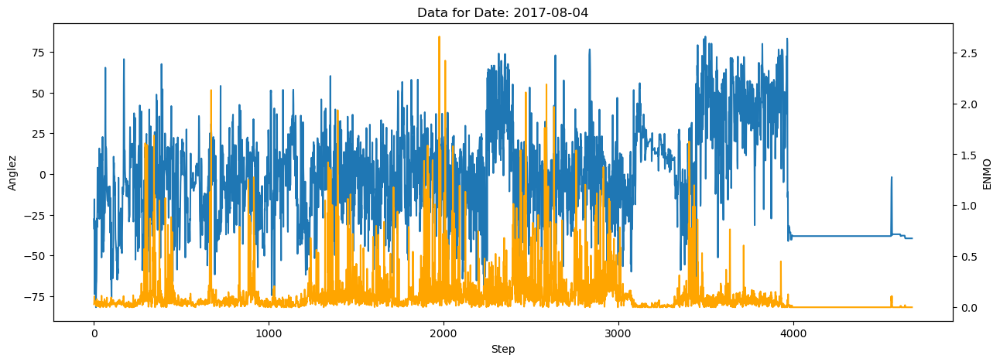

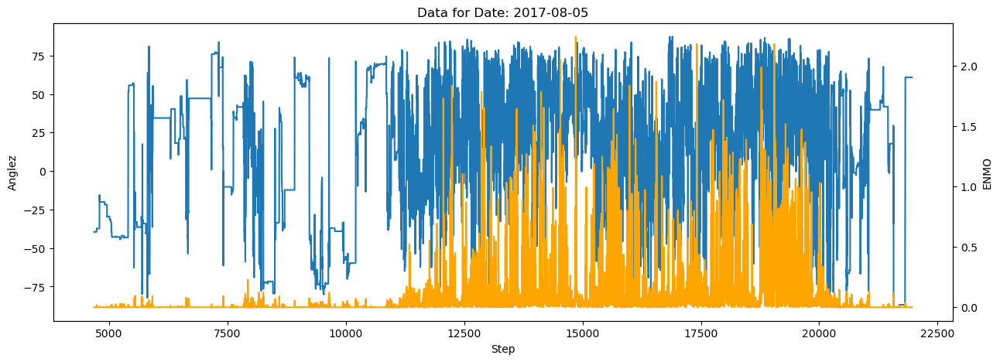

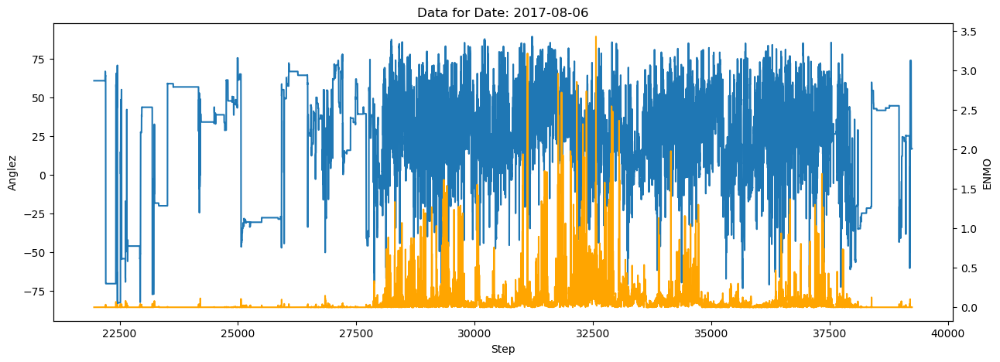

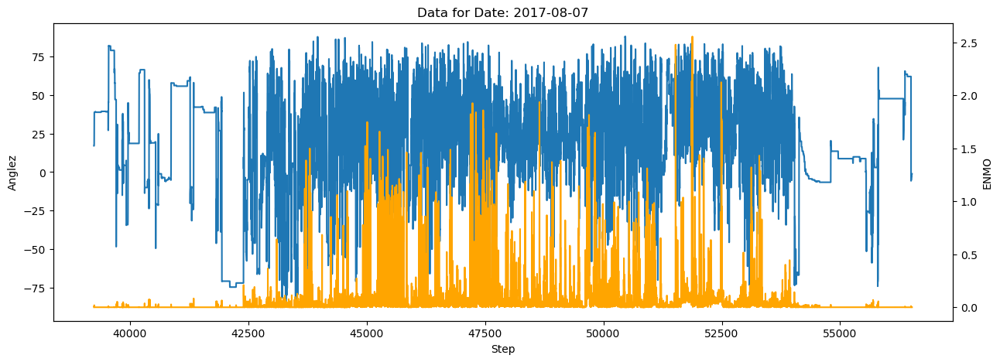

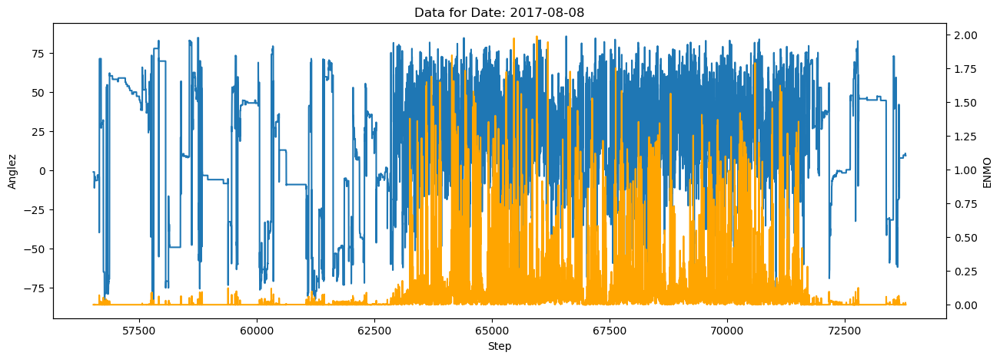

...

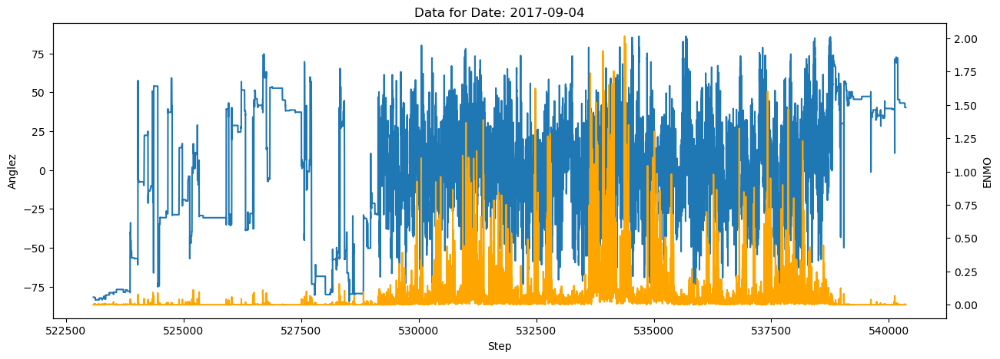

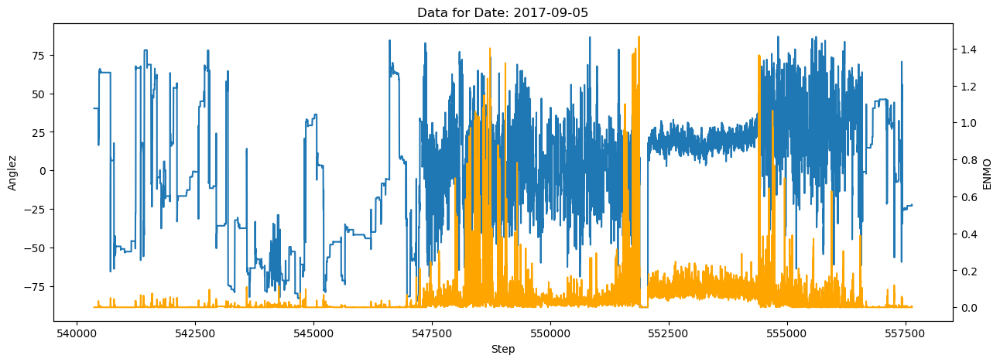

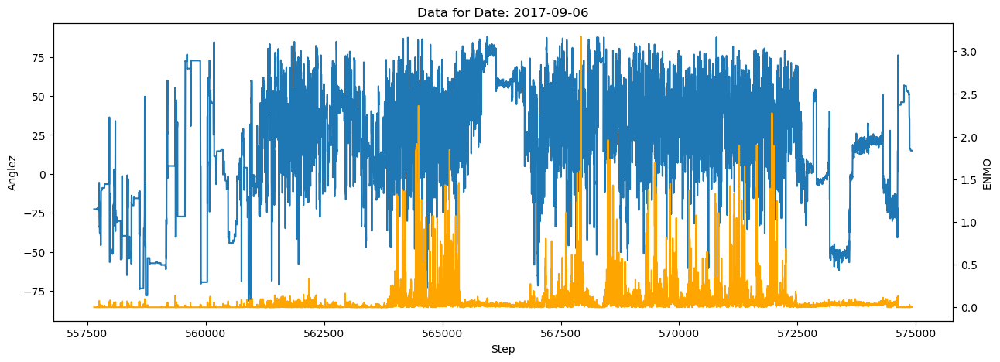

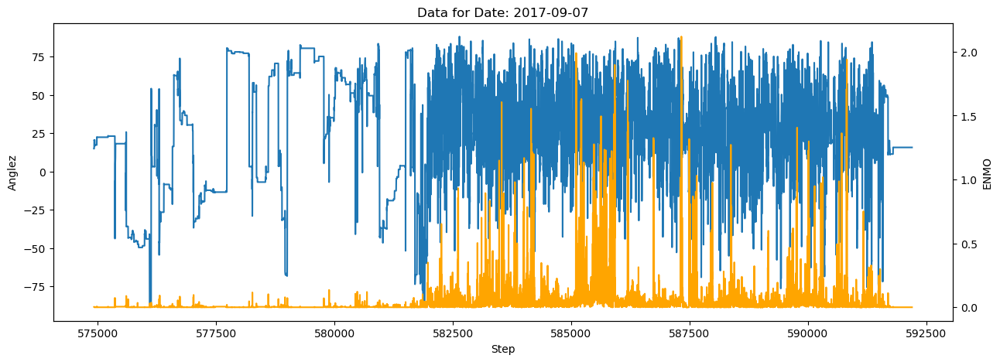

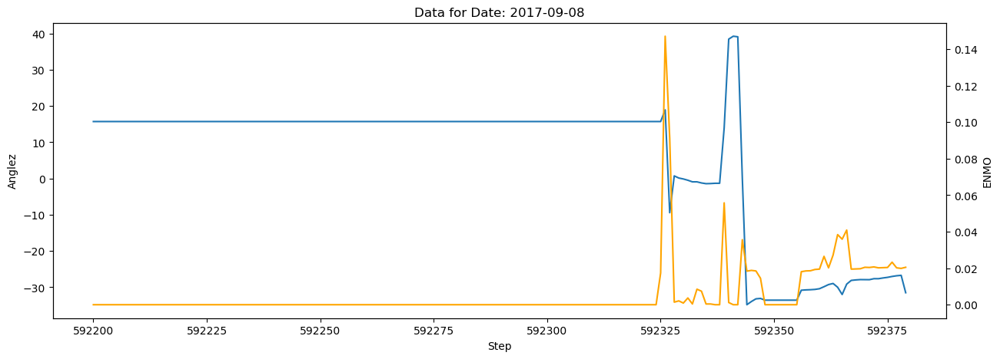

In [72]:
# Group by the 'date' column and iterate over each group
for date, data in df_example.groupby("date"):
    # Create a new figure and axis for each date
    fig, ax = plt.subplots(figsize=(15, 5))

    # Plot 'anglez' over 'step' on the primary axis
    ax.plot(data["step"], data["anglez"], label="Anglez")

    # Create a twin axis to plot 'enmo' over 'step'
    ax2 = ax.twinx()
    ax2.plot(data["step"], data["enmo"], color="orange", label="ENMO")

    # Add labels and titles
    ax.set_xlabel("Step")
    ax.set_ylabel("Anglez")
    ax2.set_ylabel("ENMO")
    plt.title(f"Data for Date: {date}")
    
    # Show the plots
    plt.show()

Some data have no ONSET and WAKEUP

In [76]:
events = train_events.compute()
events["missing"]=events["step"].isna()
events.groupby(["series_id"])["missing"].sum().sort_values()

series_id
7822ee8fe3ec      0
483d6545417f      0
a596ad0b82aa      0
18b61dd5aae8      0
a9a2f7fac455      0
               ... 
f56824b503a0     76
c107b5789660     84
fb223ed2278c     96
f564985ab692    114
78569a801a38    144
Name: missing, Length: 277, dtype: int64

<Axes: xlabel='series_id'>

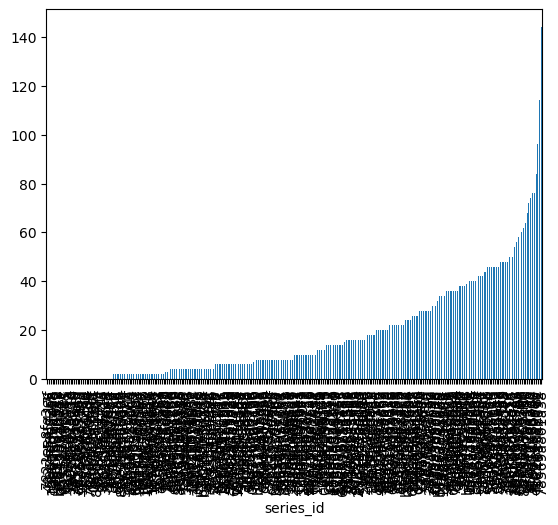

In [77]:
events.groupby(["series_id"])["missing"].sum().sort_values().plot(kind='bar')

In [82]:
example2 = train_series.loc[train_series['series_id'] == 'f56824b503a0'].reset_index(drop=True).copy()

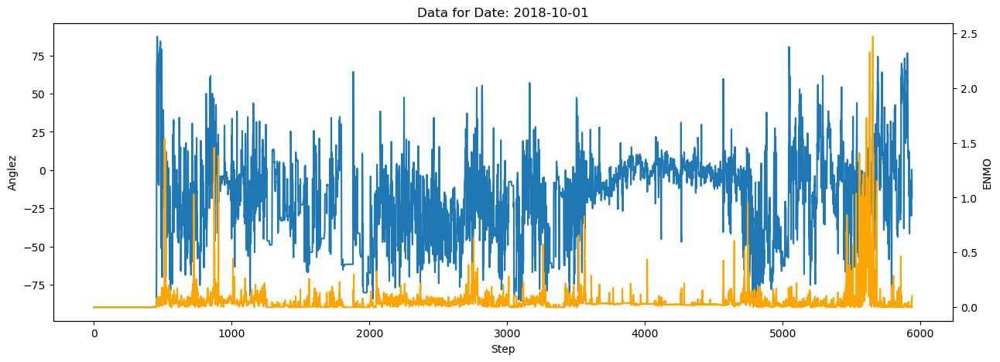

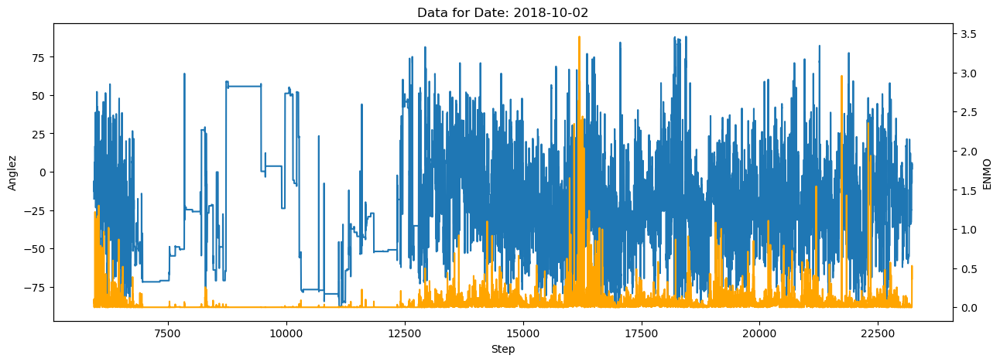

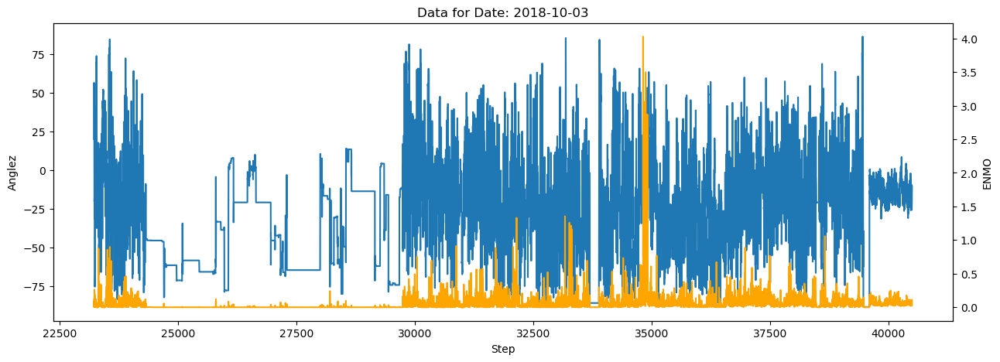

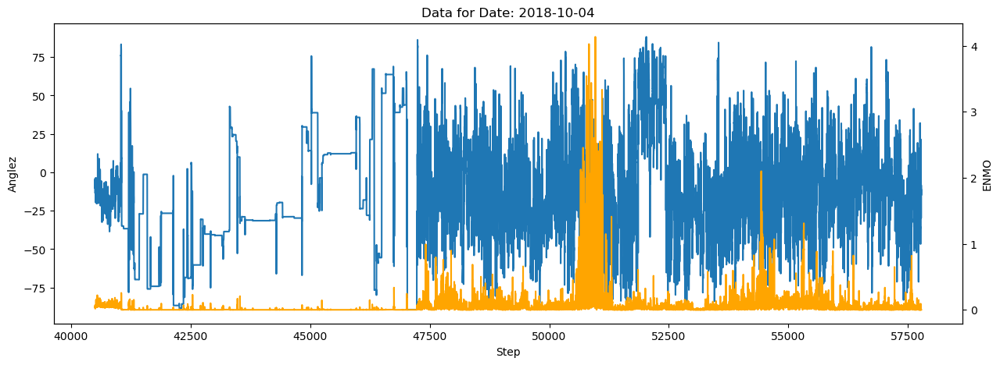

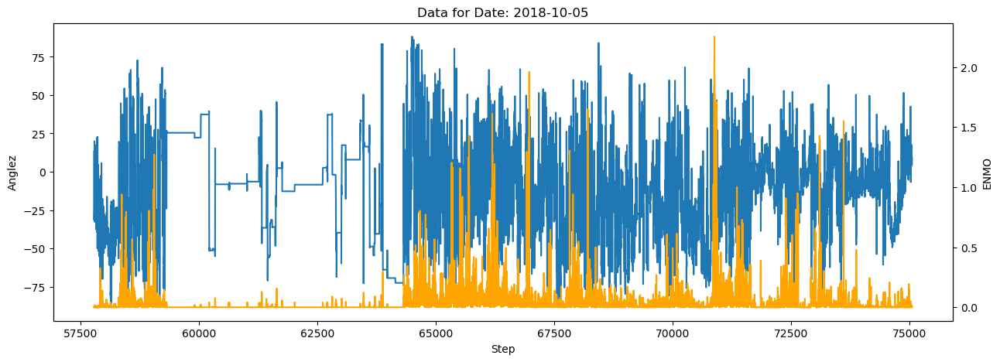

...

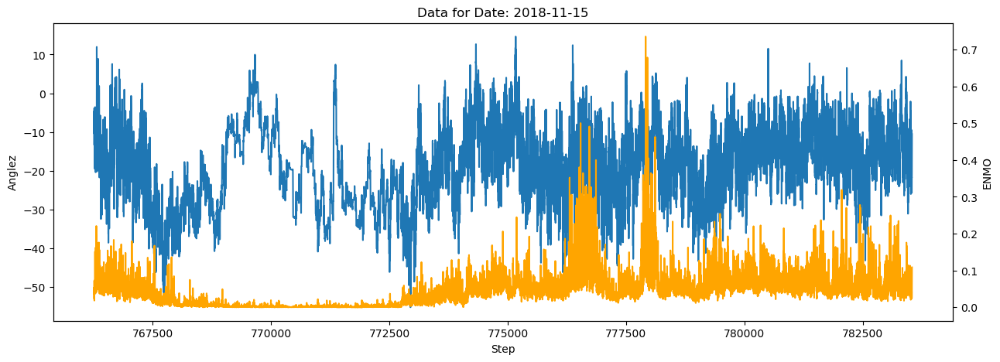

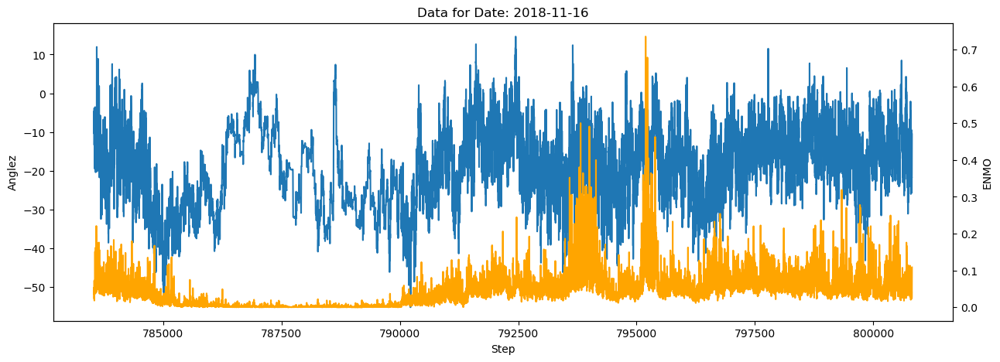

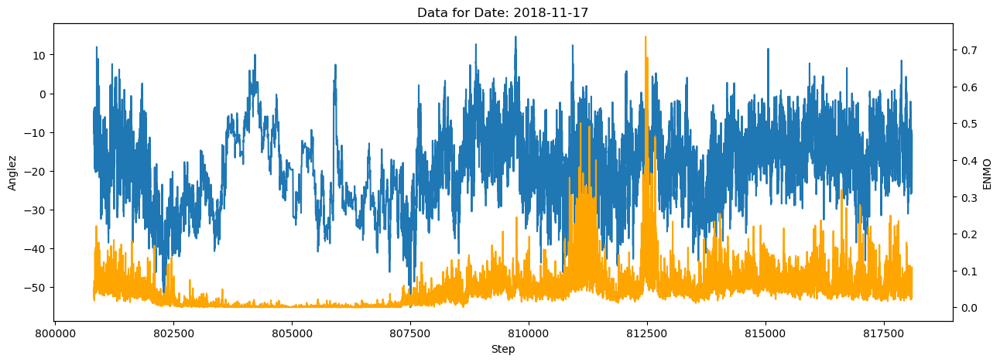

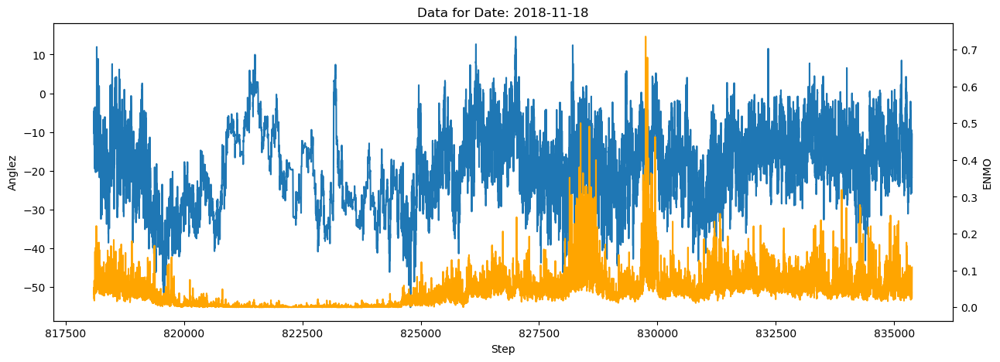

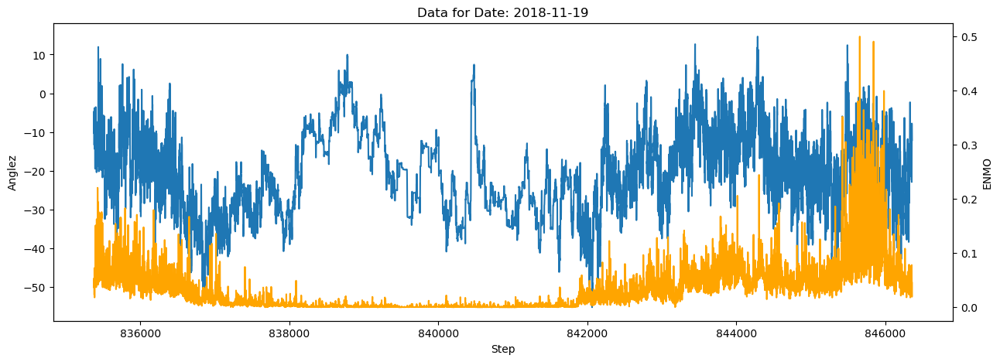

In [83]:
df_example2 = example2.compute()

df_example2['timestamp'] = pd.to_datetime(df_example2['timestamp'], utc=True)
df_example2['date'] = df_example2["timestamp"].dt.date
df_example2['hour'] = df_example2["timestamp"].dt.hour
df_example2['time'] = df_example2["timestamp"].dt.time

# Group by the 'date' column and iterate over each group
for date, data in df_example2.groupby("date"):
    # Create a new figure and axis for each date
    fig, ax = plt.subplots(figsize=(15, 5))

    # Plot 'anglez' over 'step' on the primary axis
    ax.plot(data["step"], data["anglez"], label="Anglez")

    # Create a twin axis to plot 'enmo' over 'step'
    ax2 = ax.twinx()
    ax2.plot(data["step"], data["enmo"], color="orange", label="ENMO")

    # Add labels and titles
    ax.set_xlabel("Step")
    ax.set_ylabel("Anglez")
    ax2.set_ylabel("ENMO")
    plt.title(f"Data for Date: {date}")
    
    # Show the plots
    plt.show()

In [84]:
df_example2["anglez"].value_counts()

anglez
-27.990299    1190
-25.684799    1188
-30.361401    1015
-13.814900     900
-34.735500     875
              ... 
-72.587601       1
-64.183197       1
-65.281601       1
-60.306702       1
-23.507401       1
Name: count, Length: 155588, dtype: int64

In [85]:
df_example2["enmo"].value_counts()

enmo
0.0000    89701
0.0003    20595
0.0006    10056
0.0002     9399
0.0007     8513
          ...  
0.3706        1
0.8050        1
0.8075        1
0.8612        1
0.3690        1
Name: count, Length: 6301, dtype: int64

In [86]:
df_example2["anglez_value_count"]=df_example2["anglez"].map(df_example2["anglez"].value_counts())

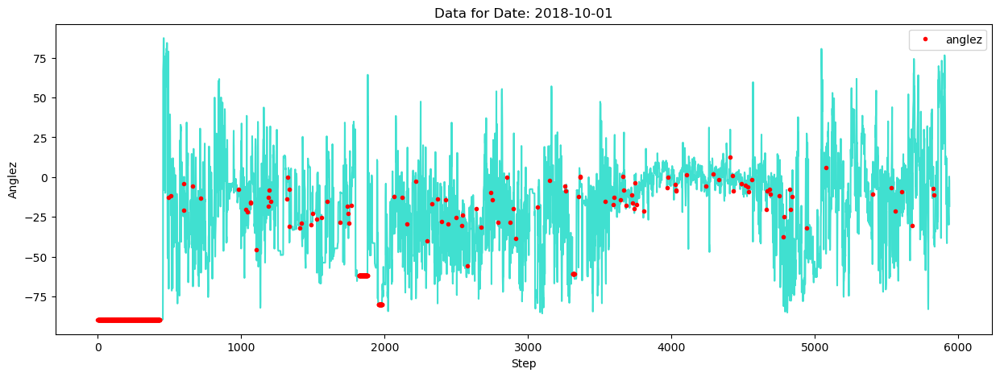

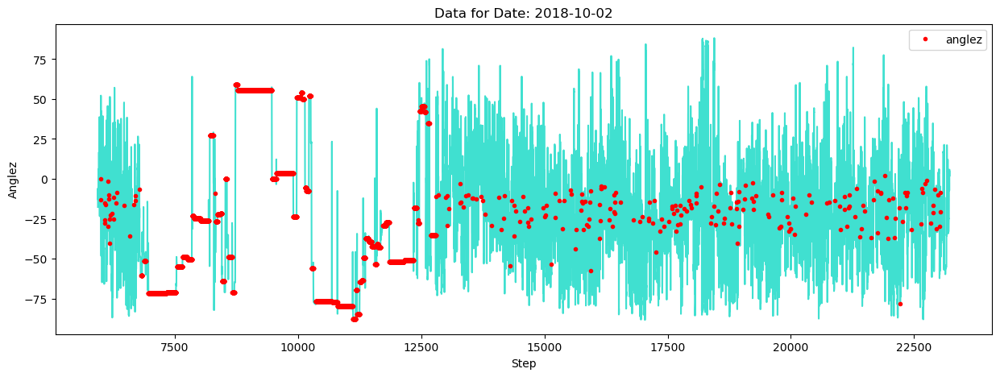

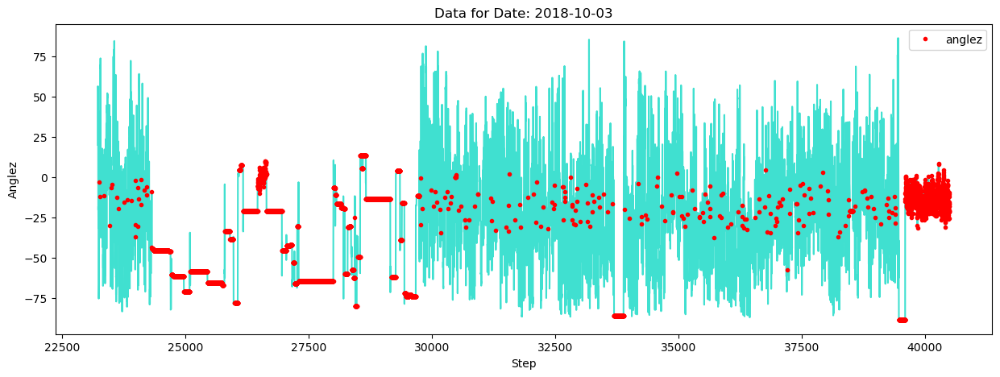

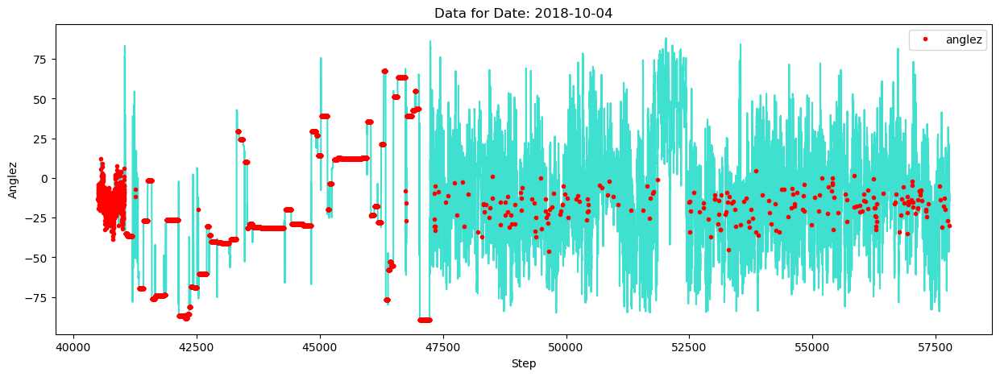

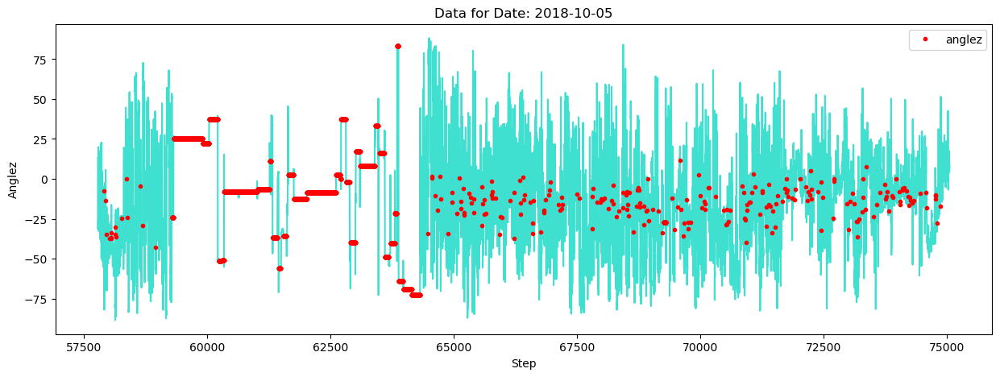

...

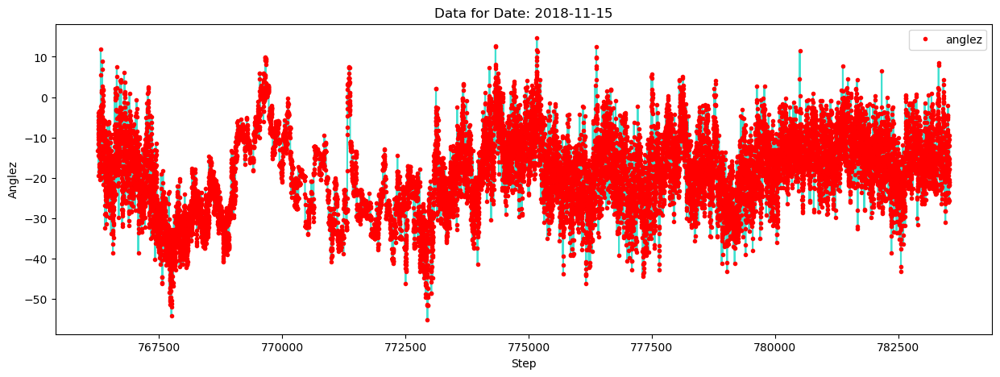

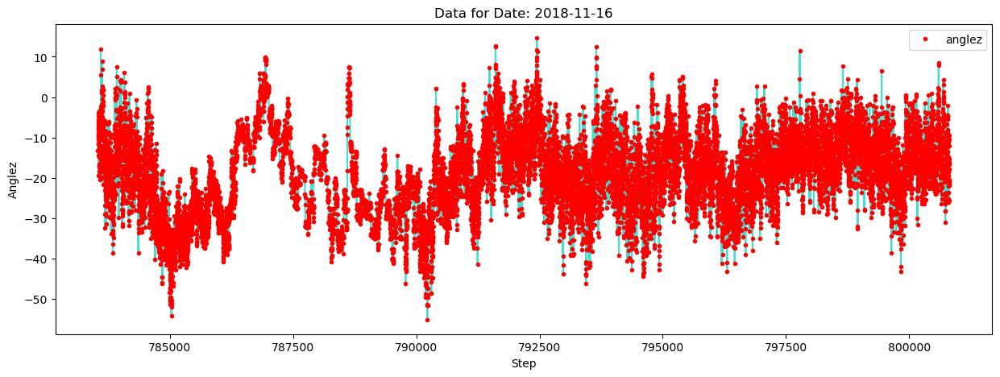

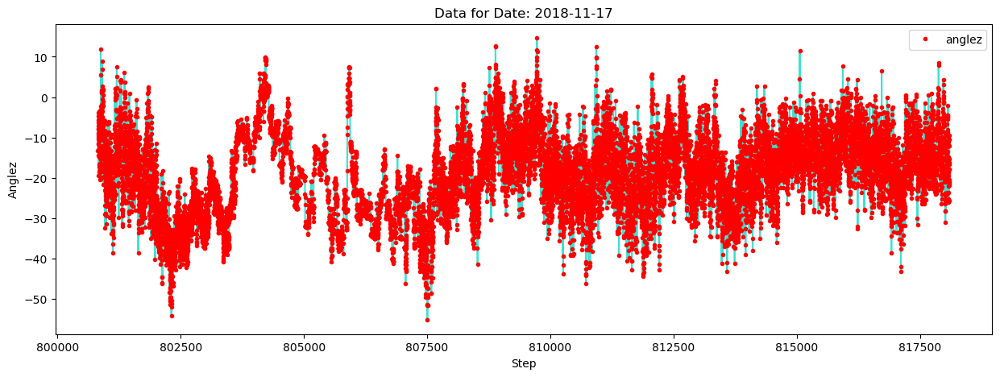

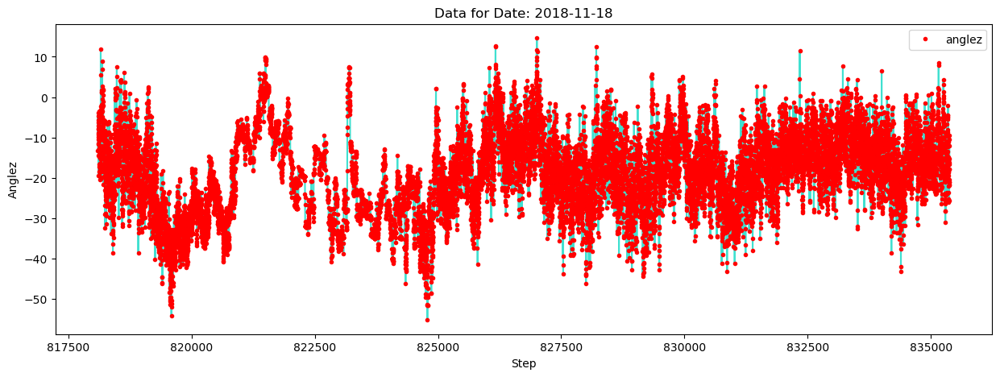

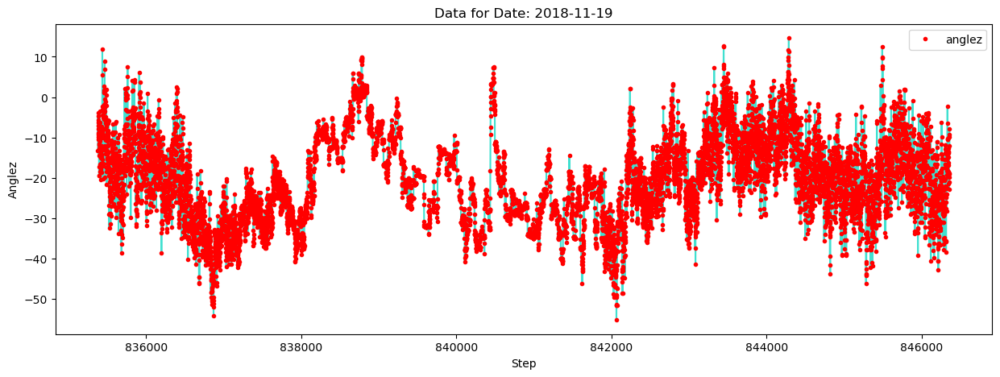

In [91]:
# Group by the 'date' column and iterate over each group
for date, data in df_example2.groupby("date"):
    # Create a new figure and axis for each date
    fig, ax = plt.subplots(figsize=(15, 5))

    # Plot 'anglez' over 'step' on the primary axis
    ax.plot(data["step"], data["anglez"], label="Anglez", color='turquoise')
    data.query('anglez_value_count > 20').set_index("step")[["anglez"]].plot(ax=ax, style='.', color='red')

    # Add labels and titles
    ax.set_xlabel("Step")
    ax.set_ylabel("Anglez")
    plt.title(f"Data for Date: {date}")
    
    # Show the plots
    plt.show()

In [93]:
events2 = train_events.dropna().copy().compute()

In [99]:
events2['timestamp'] = pd.to_datetime(events2["timestamp"], utc=True)

print(events2['timestamp'].dt.second)
print('\n',events2['timestamp'].dt.second.value_counts())

0        0
1        0
2        0
3        0
4        0
        ..
14501    0
14502    0
14503    0
14504    0
14505    0
Name: timestamp, Length: 9585, dtype: int32

 timestamp
0    9585
Name: count, dtype: int64


All the data is recorded / rounded up to the minute.

In [101]:
print(events2['timestamp'].dt.minute)
print('\n',events2['timestamp'].dt.minute.value_counts())

0        26
1        41
2        37
3        41
4         3
         ..
14501    26
14502    30
14503     7
14504    35
14505    17
Name: timestamp, Length: 9585, dtype: int32

 timestamp
7     422
0     407
37    402
52    386
18    385
22    381
30    364
56    362
45    362
48    360
41    358
26    358
33    353
11    344
15    325
3     300
59    163
6     153
29    152
51    151
36    144
21    144
14    140
44    135
25    108
58     99
20     97
13     96
35     94
10     92
5      92
50     89
43     88
23     87
8      84
28     83
55     80
2      80
32     79
47     77
9      76
1      73
38     72
17     72
40     69
53     67
39     64
24     62
16     59
42     57
46     56
31     52
49     45
57     44
4      43
27     43
54     42
12     39
34     37
19     37
Name: count, dtype: int64


In [102]:
events2['minute_in_hour'] = events2['timestamp'].dt.minute

<Axes: xlabel='minute_in_hour'>

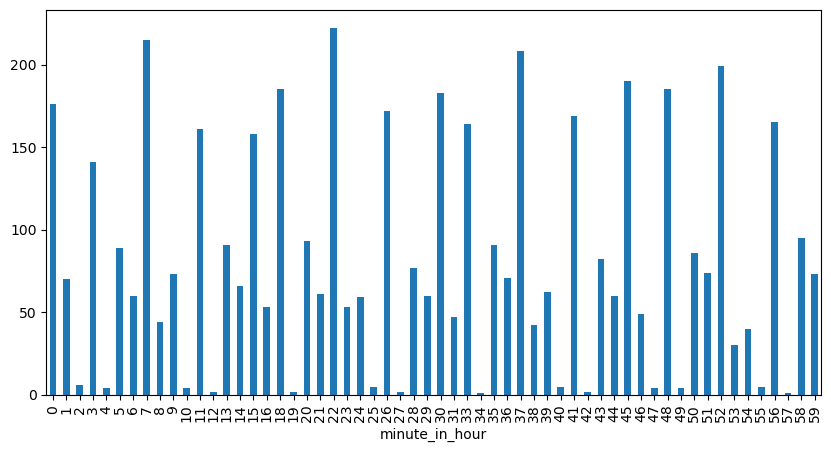

In [103]:
events2.query('event == "onset"')["minute_in_hour"].value_counts().sort_index().plot(kind='bar', figsize=(10, 5))

This plot shows how often sleep onset occurred at each minute within an hour. Some minutes (e.g., 5, 22, 45) seem to have more onset events, while other minutes (e.g., 9, 38) have fewer onset events.

The pattern is uneven, with certain minutes being more common for sleep onset, but there's no clear continuous trend. This might indicate that sleep onset is more likely to happen at certain minutes within an hour (e.g., every 5th or 15th minute).

<Axes: xlabel='min15'>

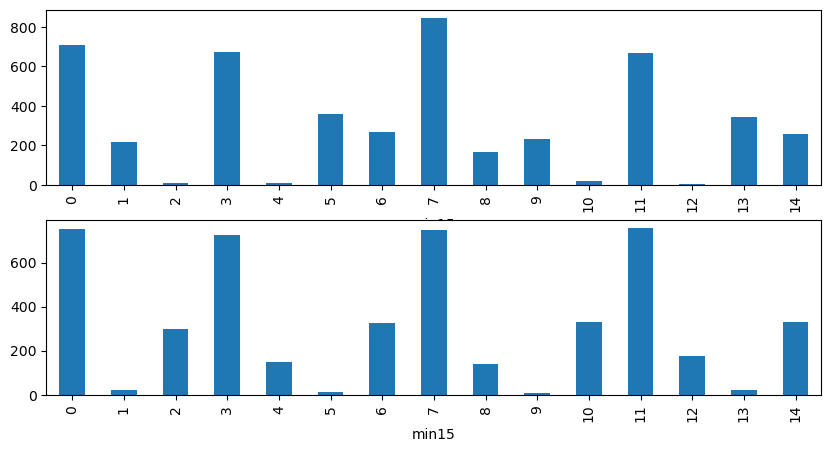

In [106]:
events2['min15'] = events2['minute_in_hour'] % 15

"""
This creates a new column called min15, which represents the remainder of dividing minute_in_hour by 15. 
This effectively groups the minutes into 15-minute intervals. For example: 
Minutes 0-14 are grouped under min15 = 0, minutes 15-29 under min15 = 1, and so on.

"""
fig, axs = plt.subplots(2, 1, figsize=(10, 5))

events2.query('event == "onset"')["min15"].value_counts().sort_index().plot(
    kind='bar', ax=axs[0])

events2.query('event == "wakeup"')["min15"].value_counts().sort_index().plot(
    kind='bar', ax=axs[1])

### How `min15` Works:
- **Modulo 15** (`% 15`) groups the `minute_in_hour` values by their remainder when divided by 15.
  - Minutes 0-14 map to `min15 = 0`
  - Minutes 15-29 map to `min15 = 1`
  - Minutes 30-44 map to `min15 = 2`
  - Minutes 45-59 map to `min15 = 3`

  But with **`minute_in_hour % 15`**, it instead **repeats every 15 minutes** (i.e., 0-14 are represented in `min15` as values between 0 and 14).

### X-Axis (min15):
The **x-axis** is showing `min15`, which represents minutes **grouped into 15-minute intervals** within each hour:
- **0**: Refers to minutes 0, 15, 30, 45 (all of these share the same remainder when divided by 15: 0).
- **1**: Refers to minutes 1, 16, 31, 46 (all of these share the same remainder when divided by 15: 1).
- **2**: Refers to minutes 2, 17, 32, 47 (and so on).
- This continues up to **14**, which refers to minutes 14, 29, 44, 59.

Thus, the **x-axis** values represent the minute positions **relative to each 15-minute block** within an hour. 

### Visual Interpretation:
- **Higher bars for `min15 = 0` and `min15 = 7`**: 
  - This means there are more events (onsets and wakeups) happening at **minutes 0, 15, 30, 45** (for `min15 = 0`) and at **minutes 7, 22, 37, 52** (for `min15 = 7`).